# PD model Estimation

# import libraries

In [3]:
import numpy as np
import pandas as pd

# Loading the data and selecting the features

# import data

In [4]:
loan_data_inputs_train = pd.read_csv('loan_data_inputs_train.csv',index_col = 0)

In [5]:
loan_data_targets_train = pd.read_csv('loan_data_targets_train.csv',index_col = 0)

In [6]:
loan_data_inputs_test = pd.read_csv('loan_data_inputs_test.csv',index_col = 0)

In [7]:
loan_data_targets_test = pd.read_csv('loan_data_targets_test.csv',index_col = 0)

# explore data

In [8]:
loan_data_inputs_train.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,dti:21.7-22.4,dti:22.4-35,dti:>35,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
427211,427211,12796369,14818505,24000,24000,24000.0,36 months,8.90,762.08,A,...,1,0,0,1,0,0,0,0,0,0
206088,206088,1439740,1691948,10000,10000,10000.0,36 months,14.33,343.39,C,...,0,0,0,1,0,0,0,0,0,0
136020,136020,5214749,6556909,20425,20425,20425.0,36 months,8.90,648.56,A,...,0,0,0,1,0,0,0,0,0,0
412305,412305,13827698,15890016,17200,17200,17200.0,36 months,16.59,609.73,D,...,0,0,0,1,0,0,0,0,0,0
36159,36159,422455,496525,8400,8400,7450.0,36 months,12.84,282.40,C,...,0,1,0,1,0,0,0,0,0,0


In [9]:
loan_data_targets_train.head()

,good_bad
427211,1
206088,1
136020,1
412305,0
36159,0


In [10]:
loan_data_inputs_train.shape

(373028, 324)

In [11]:
loan_data_targets_train.shape

(373028, 1)

In [12]:
loan_data_inputs_test.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,dti:21.7-22.4,dti:22.4-35,dti:>35,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
362514,362514,19677589,21900299,32500,32500,32500.0,60 months,14.99,773.01,C,...,0,0,0,1,0,0,0,0,0,0
288564,288564,29755527,32278795,11000,11000,11000.0,60 months,20.99,297.53,E,...,0,1,0,1,0,0,0,0,0,0
213591,213591,1343334,1588314,30000,30000,30000.0,36 months,14.65,1034.83,C,...,0,0,0,1,0,0,0,0,0,0
263083,263083,33131681,35775007,14400,14400,14400.0,60 months,14.49,338.74,C,...,0,0,0,1,0,0,0,0,0,0
165001,165001,3293168,4066358,15000,15000,14900.0,36 months,8.90,476.30,A,...,0,0,0,1,0,0,0,0,0,0


In [13]:
loan_data_inputs_test.shape

(93257, 324)

In [14]:
loan_data_targets_test.head()

,good_bad
362514,1
288564,1
213591,1
263083,1
165001,1


In [15]:
loan_data_targets_test.shape

(93257, 1)

# selecting the features

In [16]:
inputs_train_with_ref_cat = loan_data_inputs_train.loc[: , (['grade:A',

    'grade:B',

    'grade:C',

    'grade:D',

    'grade:E',

    'grade:F',

    'grade:G',

    'home_ownership:RENT_OTHER_NONE_ANY',

    'home_ownership:OWN',

    'home_ownership:MORTGAGE',

    'addr_state:ND_NE_IA_NV_FL_HI_AL',

    'addr_state:NM_VA',

    'addr_state:NY',

    'addr_state:OK_TN_MO_LA_MD_NC',

    'addr_state:CA',

    'addr_state:UT_KY_AZ_NJ',

    'addr_state:AR_MI_PA_OH_MN',

    'addr_state:RI_MA_DE_SD_IN',

    'addr_state:GA_WA_OR',

    'addr_state:WI_MT',

    'addr_state:TX',

    'addr_state:IL_CT',

    'addr_state:KS_SC_CO_VT_AK_MS',

    'addr_state:WV_NH_WY_DC_ME_ID',

    'verification_status:Not Verified',

    'verification_status:Source Verified',

    'verification_status:Verified',

    'purpose:educ__sm_b__wedd__ren_en__mov__house',

    'purpose:credit_card',

    'purpose:debt_consolidation',

    'purpose:oth__med__vacation',

    'purpose:major_purch__car__home_impr',

    'initial_list_status:f',

    'initial_list_status:w',

    'term:36',

    'term:60',

    'emp_length:0',

    'emp_length:1',

    'emp_length:2-4',

    'emp_length:5-6',

    'emp_length:7-9',

    'emp_length:10',

    'mths_since_issue_d:<38',

    'mths_since_issue_d:38-39',

    'mths_since_issue_d:40-41',

    'mths_since_issue_d:42-48',

    'mths_since_issue_d:49-52',

    'mths_since_issue_d:53-64',

    'mths_since_issue_d:65-84',

    'mths_since_issue_d:>84',

    'int_rate:<9.548',

    'int_rate:9.548-12.025',

    'int_rate:12.025-15.74',

    'int_rate:15.74-20.281',

    'int_rate:>20.281',

    'mths_since_earliest_cr_line:<140',

    'mths_since_earliest_cr_line:141-164',

    'mths_since_earliest_cr_line:165-247',

    'mths_since_earliest_cr_line:248-270',

    'mths_since_earliest_cr_line:271-352',

    'mths_since_earliest_cr_line:>352',

    'delinq_2yrs:0',

    'delinq_2yrs:1-3',

    'delinq_2yrs:>=4',

    'inq_last_6mths:0',

    'inq_last_6mths:1-2',

    'inq_last_6mths:3-6',

    'inq_last_6mths:>6',

    'open_acc:0',

    'open_acc:1-3',

    'open_acc:4-12',

    'open_acc:13-17',

    'open_acc:18-22',

    'open_acc:23-25',

    'open_acc:26-30',

    'open_acc:>=31',

    'pub_rec:0-2',

    'pub_rec:3-4',

    'pub_rec:>=5',

    'total_acc:<=27',

    'total_acc:28-51',

    'total_acc:>=52',

    'acc_now_delinq:0',

    'acc_now_delinq:>=1',

    'total_rev_hi_lim:<=5K',

    'total_rev_hi_lim:5K-10K',

    'total_rev_hi_lim:10K-20K',

    'total_rev_hi_lim:20K-30K',

    'total_rev_hi_lim:30K-40K',

    'total_rev_hi_lim:40K-55K',

    'total_rev_hi_lim:55K-95K',

    'total_rev_hi_lim:>95K',

    'annual_inc:<20K',

    'annual_inc:20K-30K',

    'annual_inc:30K-40K',

    'annual_inc:40K-50K',

    'annual_inc:50K-60K',

    'annual_inc:60K-70K',

    'annual_inc:70K-80K',

    'annual_inc:80K-90K',

    'annual_inc:90K-100K',

    'annual_inc:100K-120K',

    'annual_inc:120K-140K',

    'annual_inc:>140K',

    'dti:<=1.4',

    'dti:1.4-3.5',

    'dti:3.5-7.7',

    'dti:7.7-10.5',

    'dti:10.5-16.1',

    'dti:16.1-20.3',

    'dti:20.3-21.7',

    'dti:21.7-22.4',

    'dti:22.4-35',

    'dti:>35',

    'mths_since_last_delinq:Missing',

    'mths_since_last_delinq:0-3',

    'mths_since_last_delinq:4-30',

    'mths_since_last_delinq:31-56',

    'mths_since_last_delinq:>=57',

    'mths_since_last_record:Missing',

    'mths_since_last_record:0-2',

    'mths_since_last_record:3-20',

    'mths_since_last_record:21-31',

    'mths_since_last_record:32-80',

    'mths_since_last_record:81-86',

    'mths_since_last_record:>=86'])]

In [17]:
ref_categories = ['grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'initial_list_status:f',
'term:60',
'emp_length:0',
'mths_since_issue_d:>84',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'delinq_2yrs:>=4',
'inq_last_6mths:>6',
'open_acc:0',
'pub_rec:0-2',
'total_acc:<=27',
'acc_now_delinq:0',
'total_rev_hi_lim:<=5K',
'annual_inc:<20K',
'dti:>35',
'mths_since_last_delinq:0-3',
'mths_since_last_record:0-2']

In [18]:
inputs_train = inputs_train_with_ref_cat.drop(ref_categories, axis = 1)
inputs_train.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:NY,...,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
427211,1,0,0,0,0,0,0,1,0,0,...,1,0,0,0,1,0,0,0,0,0
206088,0,0,1,0,0,0,0,1,0,0,...,0,1,0,0,1,0,0,0,0,0
136020,1,0,0,0,0,0,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
412305,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
36159,0,0,1,0,0,0,0,1,0,0,...,1,0,0,0,1,0,0,0,0,0


# Logistic regression

In [19]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

In [20]:
reg = LogisticRegression()

In [21]:
pd.options.display.max_rows = None

In [22]:
reg.fit(inputs_train, loan_data_targets_train)

C:\Users\kamin\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\kamin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [23]:
reg.intercept_

array([-1.29857451])

In [24]:
reg.coef_

array([[ 1.16960887,  0.91020755,  0.71146369,  0.51919945,  0.33403445,
         0.14167481,  0.09175416,  0.10645074,  0.03394626,  0.05880944,
         0.0598695 ,  0.06243229,  0.07850394,  0.1359355 ,  0.10078455,
         0.18482343,  0.23619308,  0.2242218 ,  0.26316851,  0.32101136,
         0.52335573,  0.08888175, -0.00983459,  0.30832269,  0.20489985,
         0.21870856,  0.27217788,  0.05370743,  0.07833585,  0.10044705,
         0.12617871,  0.09160878,  0.06075822,  0.12328691,  1.08174569,
         0.88007351,  0.78045732,  0.57716861,  0.41463038,  0.168541  ,
        -0.06674157,  0.83919524,  0.53205682,  0.28449958,  0.09875035,
         0.05842455,  0.04058206,  0.08155512,  0.12299096,  0.12932111,
         0.07210716,  0.03436057,  0.65856992,  0.51462929,  0.30535314,
        -0.0021787 , -0.10405286, -0.13046557, -0.14681948, -0.14856864,
        -0.10850701, -0.20215755,  0.12124793,  0.17570533, -0.02089186,
         0.02548325,  0.23752938,  0.0410838 ,  0.0

In [25]:
feature_name = inputs_train.columns.values

In [26]:
summary_table = pd.DataFrame(columns =['Feature name'],data = feature_name)
summary_table['Coefficient'] = np.transpose(reg.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['intercept', reg.intercept_[0]]
summary_table = summary_table.sort_index()
summary_table

,Feature name,Coefficient
0,intercept,-1.298575
1,grade:A,1.169609
2,grade:B,0.910208
3,grade:C,0.711464
4,grade:D,0.519199
5,grade:E,0.334034
6,grade:F,0.141675
7,home_ownership:OWN,0.091754
8,home_ownership:MORTGAGE,0.106451
9,addr_state:NM_VA,0.033946


# Build a logistic regression model with P-values

In [27]:
# P values for sklearn logistic regression.

# Class to display p-values for logistic regression in sklearn.

from sklearn import linear_model
import scipy.stats as stat

class LogisticRegression_with_p_values:
    
    def __init__(self,*args,**kwargs):#,**kwargs):
        self.model = linear_model.LogisticRegression(*args,**kwargs)#,**args)

    def fit(self,X,y):
        self.model.fit(X,y)
        
        #### Get p-values for the fitted model ####
        denom = (2.0 * (1.0 + np.cosh(self.model.decision_function(X))))
        denom = np.tile(denom,(X.shape[1],1)).T
        F_ij = np.dot((X / denom).T,X) ## Fisher Information Matrix
        Cramer_Rao = np.linalg.inv(F_ij) ## Inverse Information Matrix
        sigma_estimates = np.sqrt(np.diagonal(Cramer_Rao))
        z_scores = self.model.coef_[0] / sigma_estimates # z-score for eaach model coefficient
        p_values = [stat.norm.sf(abs(x)) * 2 for x in z_scores] ### two tailed test for p-values
        
        self.coef_ = self.model.coef_
        self.intercept_ = self.model.intercept_
        #self.z_scores = z_scores
        self.p_values = p_values
        #self.sigma_estimates = sigma_estimates
        #self.F_ij = F_ij

In [28]:
reg = LogisticRegression_with_p_values()

In [29]:
reg.fit(inputs_train, loan_data_targets_train)

C:\Users\kamin\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\kamin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [30]:
summary_table = pd.DataFrame(columns =['Feature name'],data = feature_name)
summary_table['Coefficient'] = np.transpose(reg.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['intercept', reg.intercept_[0]]
summary_table = summary_table.sort_index()
summary_table

,Feature name,Coefficient
0,intercept,-1.298575
1,grade:A,1.169609
2,grade:B,0.910208
3,grade:C,0.711464
4,grade:D,0.519199
5,grade:E,0.334034
6,grade:F,0.141675
7,home_ownership:OWN,0.091754
8,home_ownership:MORTGAGE,0.106451
9,addr_state:NM_VA,0.033946


In [31]:
p_values = reg.p_values

In [32]:
p_values = np.append(np.nan, np.array(p_values))

In [33]:
summary_table['p_values'] = p_values

In [34]:
summary_table

,Feature name,Coefficient,p_values
0,intercept,-1.298575,NaN
1,grade:A,1.169609,3.901066e-38
2,grade:B,0.910208,3.559996e-50
3,grade:C,0.711464,3.671272e-36
4,grade:D,0.519199,4.919992e-22
5,grade:E,0.334034,3.870837e-12
6,grade:F,0.141675,4.739556e-03
7,home_ownership:OWN,0.091754,5.488213e-06
8,home_ownership:MORTGAGE,0.106451,5.313426e-17
9,addr_state:NM_VA,0.033946,2.895708e-01


In [35]:
inputs_train_with_ref_cat = loan_data_inputs_train.loc[:,['grade:A',
'grade:B',
'grade:C',
'grade:D',
'grade:E',
'grade:F',
'grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'home_ownership:OWN',
'home_ownership:MORTGAGE',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'addr_state:NM_VA',
'addr_state:NY',
'addr_state:OK_TN_MO_LA_MD_NC',
'addr_state:CA',
'addr_state:UT_KY_AZ_NJ',
'addr_state:AR_MI_PA_OH_MN',
'addr_state:RI_MA_DE_SD_IN',
'addr_state:GA_WA_OR',
'addr_state:WI_MT',
'addr_state:TX',
'addr_state:IL_CT',
'addr_state:KS_SC_CO_VT_AK_MS',
'addr_state:WV_NH_WY_DC_ME_ID',
'verification_status:Not Verified',
'verification_status:Source Verified',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'purpose:credit_card',
'purpose:debt_consolidation',
'purpose:oth__med__vacation',
'purpose:major_purch__car__home_impr',
'initial_list_status:f',
'initial_list_status:w',
'term:36',
'term:60',
'emp_length:0',
'emp_length:1',
'emp_length:2-4',
'emp_length:5-6',
'emp_length:7-9',
'emp_length:10',
'mths_since_issue_d:<38',
'mths_since_issue_d:38-39',
'mths_since_issue_d:40-41',
'mths_since_issue_d:42-48',
'mths_since_issue_d:49-52',
'mths_since_issue_d:53-64',
'mths_since_issue_d:65-84',
'mths_since_issue_d:>84',
'int_rate:<9.548',
'int_rate:9.548-12.025',
'int_rate:12.025-15.74',
'int_rate:15.74-20.281',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'mths_since_earliest_cr_line:141-164',
'mths_since_earliest_cr_line:165-247',
'mths_since_earliest_cr_line:248-270',
'mths_since_earliest_cr_line:271-352',
'mths_since_earliest_cr_line:>352',
'inq_last_6mths:0',
'inq_last_6mths:1-2',
'inq_last_6mths:3-6',
'inq_last_6mths:>6',
'acc_now_delinq:0',
'acc_now_delinq:>=1',
'annual_inc:<20K',
'annual_inc:20K-30K',
'annual_inc:30K-40K',
'annual_inc:40K-50K',
'annual_inc:50K-60K',
'annual_inc:60K-70K',
'annual_inc:70K-80K',
'annual_inc:80K-90K',
'annual_inc:90K-100K',
'annual_inc:100K-120K',
'annual_inc:120K-140K',
'annual_inc:>140K',
'dti:<=1.4',
'dti:1.4-3.5',
'dti:3.5-7.7',
'dti:7.7-10.5',
'dti:10.5-16.1',
'dti:16.1-20.3',
'dti:20.3-21.7',
'dti:21.7-22.4',
'dti:22.4-35',
'dti:>35',
'mths_since_last_delinq:Missing',
'mths_since_last_delinq:0-3',
'mths_since_last_delinq:4-30',
'mths_since_last_delinq:31-56',
'mths_since_last_delinq:>=57',
'mths_since_last_record:Missing',
'mths_since_last_record:0-2',
'mths_since_last_record:3-20',
'mths_since_last_record:21-31',
'mths_since_last_record:32-80',
'mths_since_last_record:81-86',
'mths_since_last_record:>=86']]

In [36]:
ref_categories = ['grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'initial_list_status:f',
'term:60',
'emp_length:0',
'mths_since_issue_d:>84',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'inq_last_6mths:>6',
'acc_now_delinq:0',
'annual_inc:<20K',
'dti:>35',
'mths_since_last_delinq:0-3',
'mths_since_last_record:0-2']

In [37]:
inputs_train = inputs_train_with_ref_cat.drop(ref_categories, axis = 1)
inputs_train.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:NY,...,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
427211,1,0,0,0,0,0,0,1,0,0,...,1,0,0,0,1,0,0,0,0,0
206088,0,0,1,0,0,0,0,1,0,0,...,0,1,0,0,1,0,0,0,0,0
136020,1,0,0,0,0,0,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
412305,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
36159,0,0,1,0,0,0,0,1,0,0,...,1,0,0,0,1,0,0,0,0,0


In [38]:
reg2 = LogisticRegression_with_p_values()
reg2.fit(inputs_train, loan_data_targets_train)

C:\Users\kamin\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\kamin\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [39]:
feature_name = inputs_train.columns.values

In [40]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table['Coefficients'] = np.transpose(reg2.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', reg2.intercept_[0]]
summary_table = summary_table.sort_index()
summary_table

,Feature name,Coefficients
0,Intercept,-1.285491
1,grade:A,1.141214
2,grade:B,0.885134
3,grade:C,0.690066
4,grade:D,0.502034
5,grade:E,0.326604
6,grade:F,0.136833
7,home_ownership:OWN,0.091909
8,home_ownership:MORTGAGE,0.106067
9,addr_state:NM_VA,0.028895


In [41]:
p_values = reg2.p_values
p_values = np.append(np.nan, np.array(p_values))
summary_table['p_values'] = p_values
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-1.285491,NaN
1,grade:A,1.141214,1.834338e-36
2,grade:B,0.885134,7.376524e-48
3,grade:C,0.690066,1.779886e-34
4,grade:D,0.502034,4.885686e-21
5,grade:E,0.326604,4.525050e-12
6,grade:F,0.136833,5.268026e-03
7,home_ownership:OWN,0.091909,5.026786e-06
8,home_ownership:MORTGAGE,0.106067,4.972854e-17
9,addr_state:NM_VA,0.028895,3.667784e-01


In [42]:
import pickle

In [43]:
pickle.dump(reg2, open('pd_model.sav', 'wb'))

# PD Model Validation (Test) 

# out-of-sample Validation (test)

In [44]:
inputs_test_with_ref_cat = loan_data_inputs_test.loc[: , ['grade:A',
'grade:B',
'grade:C',
'grade:D',
'grade:E',
'grade:F',
'grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'home_ownership:OWN',
'home_ownership:MORTGAGE',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'addr_state:NM_VA',
'addr_state:NY',
'addr_state:OK_TN_MO_LA_MD_NC',
'addr_state:CA',
'addr_state:UT_KY_AZ_NJ',
'addr_state:AR_MI_PA_OH_MN',
'addr_state:RI_MA_DE_SD_IN',
'addr_state:GA_WA_OR',
'addr_state:WI_MT',
'addr_state:TX',
'addr_state:IL_CT',
'addr_state:KS_SC_CO_VT_AK_MS',
'addr_state:WV_NH_WY_DC_ME_ID',
'verification_status:Not Verified',
'verification_status:Source Verified',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'purpose:credit_card',
'purpose:debt_consolidation',
'purpose:oth__med__vacation',
'purpose:major_purch__car__home_impr',
'initial_list_status:f',
'initial_list_status:w',
'term:36',
'term:60',
'emp_length:0',
'emp_length:1',
'emp_length:2-4',
'emp_length:5-6',
'emp_length:7-9',
'emp_length:10',
'mths_since_issue_d:<38',
'mths_since_issue_d:38-39',
'mths_since_issue_d:40-41',
'mths_since_issue_d:42-48',
'mths_since_issue_d:49-52',
'mths_since_issue_d:53-64',
'mths_since_issue_d:65-84',
'mths_since_issue_d:>84',
'int_rate:<9.548',
'int_rate:9.548-12.025',
'int_rate:12.025-15.74',
'int_rate:15.74-20.281',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'mths_since_earliest_cr_line:141-164',
'mths_since_earliest_cr_line:165-247',
'mths_since_earliest_cr_line:248-270',
'mths_since_earliest_cr_line:271-352',
'mths_since_earliest_cr_line:>352',
'inq_last_6mths:0',
'inq_last_6mths:1-2',
'inq_last_6mths:3-6',
'inq_last_6mths:>6',
'acc_now_delinq:0',
'acc_now_delinq:>=1',
'annual_inc:<20K',
'annual_inc:20K-30K',
'annual_inc:30K-40K',
'annual_inc:40K-50K',
'annual_inc:50K-60K',
'annual_inc:60K-70K',
'annual_inc:70K-80K',
'annual_inc:80K-90K',
'annual_inc:90K-100K',
'annual_inc:100K-120K',
'annual_inc:120K-140K',
'annual_inc:>140K',
'dti:<=1.4',
'dti:1.4-3.5',
'dti:3.5-7.7',
'dti:7.7-10.5',
'dti:10.5-16.1',
'dti:16.1-20.3',
'dti:20.3-21.7',
'dti:21.7-22.4',
'dti:22.4-35',
'dti:>35',
'mths_since_last_delinq:Missing',
'mths_since_last_delinq:0-3',
'mths_since_last_delinq:4-30',
'mths_since_last_delinq:31-56',
'mths_since_last_delinq:>=57',
'mths_since_last_record:Missing',
'mths_since_last_record:0-2',
'mths_since_last_record:3-20',
'mths_since_last_record:21-31',
'mths_since_last_record:32-80',
'mths_since_last_record:81-86',
'mths_since_last_record:>=86']]

In [45]:
ref_categories = ['grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'initial_list_status:f',
'term:60',
'emp_length:0',
'mths_since_issue_d:>84',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'inq_last_6mths:>6',
'acc_now_delinq:0',
'annual_inc:<20K',
'dti:>35',
'mths_since_last_delinq:0-3',
'mths_since_last_record:0-2']

In [46]:
inputs_test = inputs_test_with_ref_cat.drop(ref_categories, axis = 1)
inputs_test.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:NY,...,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
362514,0,0,1,0,0,0,0,1,0,0,...,1,0,0,0,1,0,0,0,0,0
288564,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
213591,0,0,1,0,0,0,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
263083,0,0,1,0,0,0,0,1,0,0,...,1,0,0,0,1,0,0,0,0,0
165001,1,0,0,0,0,0,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0


In [47]:
y_hat_test = reg2.model.predict(inputs_test)

In [48]:
y_hat_test

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [49]:
y_hat_test_proba = reg2.model.predict_proba(inputs_test)

In [50]:
y_hat_test_proba

array([[0.07569194, 0.92430806],
       [0.15349635, 0.84650365],
       [0.11433432, 0.88566568],
       ...,
       [0.02670535, 0.97329465],
       [0.04011917, 0.95988083],
       [0.04761749, 0.95238251]])

In [51]:
y_hat_test_proba[: ][:,1]

array([0.92430806, 0.84650365, 0.88566568, ..., 0.97329465, 0.95988083,
       0.95238251])

In [52]:
y_hat_test_proba

array([[0.07569194, 0.92430806],
       [0.15349635, 0.84650365],
       [0.11433432, 0.88566568],
       ...,
       [0.02670535, 0.97329465],
       [0.04011917, 0.95988083],
       [0.04761749, 0.95238251]])

In [53]:
y_hat_test_proba[: ][: , 1]

array([0.92430806, 0.84650365, 0.88566568, ..., 0.97329465, 0.95988083,
       0.95238251])

In [54]:
y_hat_test_proba = y_hat_test_proba[: ][: , 1]

In [55]:
y_hat_test_proba

array([0.92430806, 0.84650365, 0.88566568, ..., 0.97329465, 0.95988083,
       0.95238251])

In [56]:
loan_data_targets_test_temp = loan_data_targets_test

In [57]:
loan_data_targets_test_temp.reset_index(drop = True, inplace = True)

In [58]:
df_actual_predicted_probs = pd.concat([loan_data_targets_test_temp, pd.DataFrame(y_hat_test_proba)], axis = 1)

In [59]:
df_actual_predicted_probs.shape

(93257, 2)

In [60]:
df_actual_predicted_probs.columns = ['loan_data_targets_test', 'y_hat_test_proba']

In [61]:
df_actual_predicted_probs.index = loan_data_inputs_test.index

In [62]:
df_actual_predicted_probs.head()

,loan_data_targets_test,y_hat_test_proba
362514,1,0.924308
288564,1,0.846504
213591,1,0.885666
263083,1,0.940737
165001,1,0.968782


# Accuracy and area under the curve

In [63]:
tr = 0.5
df_actual_predicted_probs['y_hat_test'] = np.where(df_actual_predicted_probs['y_hat_test_proba']> tr,1,0)

In [64]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'],df_actual_predicted_probs['y_hat_test'],
           rownames= ['Actual'], colnames = ['predicted'])

predicted,0,1
Actual,,
0,6,10184
1,5,83062


In [65]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'],df_actual_predicted_probs['y_hat_test'],
           rownames= ['Actual'], colnames = ['predicted'])/df_actual_predicted_probs.shape[0]

predicted,0,1
Actual,,
0,0.000064,0.109204
1,0.000054,0.890678


In [66]:
(pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[0, 0] + (
    pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[1, 1]

0.8907427860643169

In [67]:
from sklearn.metrics import roc_curve, roc_auc_score

In [68]:
roc_curve(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'])

(array([0.        , 0.        , 0.        , ..., 0.99990186, 0.99990186,
        1.        ]),
 array([0.00000000e+00, 1.20384750e-05, 1.20384750e-04, ...,
        9.99975923e-01, 1.00000000e+00, 1.00000000e+00]),
 array([1.99266955, 0.99266955, 0.99071534, ..., 0.44818004, 0.39392616,
        0.39324099]))

In [69]:
fpr, tpr, thresholds = roc_curve(df_actual_predicted_probs['loan_data_targets_test'],
                                 df_actual_predicted_probs['y_hat_test_proba'])

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

Text(0.5, 1.0, 'ROC curve')

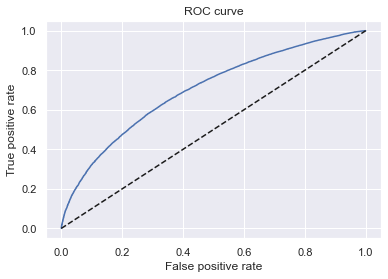

In [71]:
plt.plot(fpr, tpr)
plt.plot(fpr, fpr, linestyle = '--', color = 'k')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')

In [72]:
AUROC = roc_auc_score(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'])
AUROC

0.7021158198639161

# Gini and Kolmogorov-smirnov

In [73]:
# sort by predicted probability bu accending order
df_actual_predicted_probs = df_actual_predicted_probs.sort_values('y_hat_test_proba')

In [74]:
df_actual_predicted_probs.head()

,loan_data_targets_test,y_hat_test_proba,y_hat_test
39810,0,0.393241,0
42341,1,0.393926,0
42344,1,0.417322,0
40518,0,0.448180,0
40173,0,0.468555,0


In [75]:
df_actual_predicted_probs.tail()

,loan_data_targets_test,y_hat_test_proba,y_hat_test
262480,1,0.991280,1
231463,1,0.991299,1
239228,1,0.991683,1
261086,1,0.992083,1
242624,1,0.992670,1


In [76]:
# calculating the cumulative proportion by reindexing
# lowest proba with index 0 and so on
# df.reset_index() -- reset the index of dataframe. optionally, one can save the old indexes as new column
df_actual_predicted_probs = df_actual_predicted_probs.reset_index()

In [77]:
df_actual_predicted_probs.head()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test
0,39810,0,0.393241,0
1,42341,1,0.393926,0
2,42344,1,0.417322,0
3,40518,0,0.448180,0
4,40173,0,0.468555,0


In [78]:
df_actual_predicted_probs.tail()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test
93252,262480,1,0.991280,1
93253,231463,1,0.991299,1
93254,239228,1,0.991683,1
93255,261086,1,0.992083,1
93256,242624,1,0.992670,1


In [79]:
df_actual_predicted_probs['Cumulative N Population'] = df_actual_predicted_probs.index + 1
df_actual_predicted_probs['Cumulative N Good'] = df_actual_predicted_probs['loan_data_targets_test'].cumsum()
df_actual_predicted_probs['Cumulative N Bad'] = df_actual_predicted_probs['Cumulative N Population'] - df_actual_predicted_probs['loan_data_targets_test'].cumsum()

In [80]:
df_actual_predicted_probs.head()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test,Cumulative N Population,Cumulative N Good,Cumulative N Bad
0,39810,0,0.393241,0,1,0,1
1,42341,1,0.393926,0,2,1,1
2,42344,1,0.417322,0,3,2,1
3,40518,0,0.448180,0,4,2,2
4,40173,0,0.468555,0,5,2,3


In [81]:
df_actual_predicted_probs['Cumulative Perc Population'] = df_actual_predicted_probs['Cumulative N Population'] / (df_actual_predicted_probs.shape[0])
df_actual_predicted_probs['Cumulative Perc Good'] = df_actual_predicted_probs['Cumulative N Good'] / df_actual_predicted_probs['loan_data_targets_test'].sum()
df_actual_predicted_probs['Cumulative Perc Bad'] = df_actual_predicted_probs['Cumulative N Bad'] / (df_actual_predicted_probs.shape[0] - df_actual_predicted_probs['loan_data_targets_test'].sum())

In [82]:
df_actual_predicted_probs.head()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test,Cumulative N Population,Cumulative N Good,Cumulative N Bad,Cumulative Perc Population,Cumulative Perc Good,Cumulative Perc Bad
0,39810,0,0.393241,0,1,0,1,0.000011,0.000000,0.000098
1,42341,1,0.393926,0,2,1,1,0.000021,0.000012,0.000098
2,42344,1,0.417322,0,3,2,1,0.000032,0.000024,0.000098
3,40518,0,0.448180,0,4,2,2,0.000043,0.000024,0.000196
4,40173,0,0.468555,0,5,2,3,0.000054,0.000024,0.000294


In [83]:
df_actual_predicted_probs.tail()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test,Cumulative N Population,Cumulative N Good,Cumulative N Bad,Cumulative Perc Population,Cumulative Perc Good,Cumulative Perc Bad
93252,262480,1,0.991280,1,93253,83063,10190,0.999957,0.999952,1.0
93253,231463,1,0.991299,1,93254,83064,10190,0.999968,0.999964,1.0
93254,239228,1,0.991683,1,93255,83065,10190,0.999979,0.999976,1.0
93255,261086,1,0.992083,1,93256,83066,10190,0.999989,0.999988,1.0
93256,242624,1,0.992670,1,93257,83067,10190,1.000000,1.000000,1.0


Text(0.5, 1.0, 'Gini')

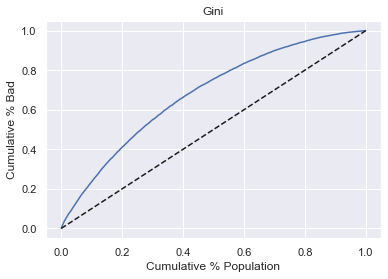

In [84]:
plt.plot(df_actual_predicted_probs['Cumulative Perc Population'], df_actual_predicted_probs['Cumulative Perc Bad'])
plt.plot(df_actual_predicted_probs['Cumulative Perc Population'], df_actual_predicted_probs['Cumulative Perc Population'], linestyle = '--', color = 'k')
plt.xlabel('Cumulative % Population')
plt.ylabel('Cumulative % Bad')
plt.title('Gini')

In [85]:
Gini = AUROC * 2 - 1
Gini

0.40423163972783227

Text(0.5, 1.0, 'Kolmogorov-Smirnov')

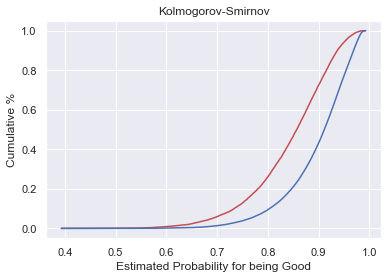

In [86]:
plt.plot(df_actual_predicted_probs['y_hat_test_proba'], df_actual_predicted_probs['Cumulative Perc Bad'], color = 'r')
plt.plot(df_actual_predicted_probs['y_hat_test_proba'], df_actual_predicted_probs['Cumulative Perc Good'], color = 'b')
plt.xlabel('Estimated Probability for being Good')
plt.ylabel('Cumulative %')
plt.title('Kolmogorov-Smirnov')

In [87]:
KS = max(df_actual_predicted_probs['Cumulative Perc Bad'] - df_actual_predicted_probs['Cumulative Perc Good'])
KS

0.29652196762363797

# section 8: Applying the PD Model for decision making

# calculating PD of indivisual account

In [88]:
pd.options.display.max_columns = None

In [89]:
inputs_test_with_ref_cat.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:NY,addr_state:OK_TN_MO_LA_MD_NC,addr_state:CA,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:TX,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:credit_card,purpose:debt_consolidation,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,initial_list_status:f,initial_list_status:w,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issue_d:<38,mths_since_issue_d:38-39,mths_since_issue_d:40-41,mths_since_issue_d:42-48,mths_since_issue_d:49-52,mths_since_issue_d:53-64,mths_since_issue_d:65-84,mths_since_issue_d:>84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:>20.281,mths_since_earliest_cr_line:<140,mths_since_earliest_cr_line:141-164,mths_since_earliest_cr_line:165-247,mths_since_earliest_cr_line:248-270,mths_since_earliest_cr_line:271-352,mths_since_earliest_cr_line:>352,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,inq_last_6mths:>6,acc_now_delinq:0,acc_now_delinq:>=1,annual_inc:<20K,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,dti:<=1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:10.5-16.1,dti:16.1-20.3,dti:20.3-21.7,dti:21.7-22.4,dti:22.4-35,dti:>35,mths_since_last_delinq:Missing,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
362514,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
288564,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0
213591,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
263083,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
165001,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0


In [90]:
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-1.285491,NaN
1,grade:A,1.141214,1.834338e-36
2,grade:B,0.885134,7.376524e-48
3,grade:C,0.690066,1.779886e-34
4,grade:D,0.502034,4.885686e-21
5,grade:E,0.326604,4.525050e-12
6,grade:F,0.136833,5.268026e-03
7,home_ownership:OWN,0.091909,5.026786e-06
8,home_ownership:MORTGAGE,0.106067,4.972854e-17
9,addr_state:NM_VA,0.028895,3.667784e-01


In [91]:
y_hat_test_proba

array([0.92430806, 0.84650365, 0.88566568, ..., 0.97329465, 0.95988083,
       0.95238251])

# Creating a scorecard 

In [92]:
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-1.285491,NaN
1,grade:A,1.141214,1.834338e-36
2,grade:B,0.885134,7.376524e-48
3,grade:C,0.690066,1.779886e-34
4,grade:D,0.502034,4.885686e-21
5,grade:E,0.326604,4.525050e-12
6,grade:F,0.136833,5.268026e-03
7,home_ownership:OWN,0.091909,5.026786e-06
8,home_ownership:MORTGAGE,0.106067,4.972854e-17
9,addr_state:NM_VA,0.028895,3.667784e-01


In [93]:
# now we add the reference categories for making scorecard
ref_categories

['grade:G',
 'home_ownership:RENT_OTHER_NONE_ANY',
 'addr_state:ND_NE_IA_NV_FL_HI_AL',
 'verification_status:Verified',
 'purpose:educ__sm_b__wedd__ren_en__mov__house',
 'initial_list_status:f',
 'term:60',
 'emp_length:0',
 'mths_since_issue_d:>84',
 'int_rate:>20.281',
 'mths_since_earliest_cr_line:<140',
 'inq_last_6mths:>6',
 'acc_now_delinq:0',
 'annual_inc:<20K',
 'dti:>35',
 'mths_since_last_delinq:0-3',
 'mths_since_last_record:0-2']

In [94]:
df_ref_categories = pd.DataFrame(ref_categories, columns = ['Feature name'])
df_ref_categories['Coefficients'] = 0
df_ref_categories['p_values'] = np.nan
df_ref_categories

,Feature name,Coefficients,p_values
0,grade:G,0,NaN
1,home_ownership:RENT_OTHER_NONE_ANY,0,NaN
2,addr_state:ND_NE_IA_NV_FL_HI_AL,0,NaN
3,verification_status:Verified,0,NaN
4,purpose:educ__sm_b__wedd__ren_en__mov__house,0,NaN
5,initial_list_status:f,0,NaN
6,term:60,0,NaN
7,emp_length:0,0,NaN
8,mths_since_issue_d:>84,0,NaN
9,int_rate:>20.281,0,NaN


In [95]:
df_scorecard = pd.concat([summary_table, df_ref_categories])
df_scorecard = df_scorecard.reset_index()
df_scorecard

,index,Feature name,Coefficients,p_values
0,0,Intercept,-1.285491,NaN
1,1,grade:A,1.141214,1.834338e-36
2,2,grade:B,0.885134,7.376524e-48
3,3,grade:C,0.690066,1.779886e-34
4,4,grade:D,0.502034,4.885686e-21
5,5,grade:E,0.326604,4.525050e-12
6,6,grade:F,0.136833,5.268026e-03
7,7,home_ownership:OWN,0.091909,5.026786e-06
8,8,home_ownership:MORTGAGE,0.106067,4.972854e-17
9,9,addr_state:NM_VA,0.028895,3.667784e-01


In [96]:
df_scorecard['Original feature name'] = df_scorecard['Feature name'].str.split(':').str[0]

In [97]:
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name
0,0,Intercept,-1.285491,NaN,Intercept
1,1,grade:A,1.141214,1.834338e-36,grade
2,2,grade:B,0.885134,7.376524e-48,grade
3,3,grade:C,0.690066,1.779886e-34,grade
4,4,grade:D,0.502034,4.885686e-21,grade
5,5,grade:E,0.326604,4.525050e-12,grade
6,6,grade:F,0.136833,5.268026e-03,grade
7,7,home_ownership:OWN,0.091909,5.026786e-06,home_ownership
8,8,home_ownership:MORTGAGE,0.106067,4.972854e-17,home_ownership
9,9,addr_state:NM_VA,0.028895,3.667784e-01,addr_state


In [98]:
min_score = 300
max_score = 850

In [99]:
df_scorecard.groupby('Original feature name')['Coefficients'].min()

Original feature name
Intercept                     -1.285491
acc_now_delinq                 0.000000
addr_state                     0.000000
annual_inc                    -0.079789
dti                            0.000000
emp_length                     0.000000
grade                          0.000000
home_ownership                 0.000000
initial_list_status            0.000000
inq_last_6mths                 0.000000
int_rate                       0.000000
mths_since_earliest_cr_line    0.000000
mths_since_issue_d            -0.062584
mths_since_last_delinq         0.000000
mths_since_last_record         0.000000
purpose                        0.000000
term                           0.000000
verification_status           -0.010896
Name: Coefficients, dtype: float64

In [100]:
min_sum_coef = df_scorecard.groupby('Original feature name')['Coefficients'].min().sum()
min_sum_coef

-1.4387598894066882

In [101]:
df_scorecard.groupby('Original feature name')['Coefficients'].max()

Original feature name
Intercept                     -1.285491
acc_now_delinq                 0.201680
addr_state                     0.516382
annual_inc                     0.557060
dti                            0.377530
emp_length                     0.126244
grade                          1.141214
home_ownership                 0.106067
initial_list_status            0.054367
inq_last_6mths                 0.655868
int_rate                       0.872008
mths_since_earliest_cr_line    0.128505
mths_since_issue_d             1.091352
mths_since_last_delinq         0.205905
mths_since_last_record         0.397450
purpose                        0.305106
term                           0.078435
verification_status            0.084616
Name: Coefficients, dtype: float64

In [102]:
max_sum_coef = df_scorecard.groupby('Original feature name')['Coefficients'].max().sum()
max_sum_coef

5.614298446676704

In [103]:
df_scorecard['Score - Calculation'] = df_scorecard['Coefficients'] * (max_score - min_score) / (max_sum_coef - min_sum_coef)
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation
0,0,Intercept,-1.285491,NaN,Intercept,-100.243025
1,1,grade:A,1.141214,1.834338e-36,grade,88.992241
2,2,grade:B,0.885134,7.376524e-48,grade,69.023102
3,3,grade:C,0.690066,1.779886e-34,grade,53.811564
4,4,grade:D,0.502034,4.885686e-21,grade,39.148791
5,5,grade:E,0.326604,4.525050e-12,grade,25.468685
6,6,grade:F,0.136833,5.268026e-03,grade,10.670265
7,7,home_ownership:OWN,0.091909,5.026786e-06,home_ownership,7.167126
8,8,home_ownership:MORTGAGE,0.106067,4.972854e-17,home_ownership,8.271132
9,9,addr_state:NM_VA,0.028895,3.667784e-01,addr_state,2.253264


In [104]:
df_scorecard['Score - Calculation'][0] = ((df_scorecard['Coefficients'][0] - min_sum_coef) / (max_sum_coef - min_sum_coef)) * (max_score - min_score) + min_score
df_scorecard

C:\Users\kamin\AppData\Local\Temp\ipykernel_9956\1263832758.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scorecard['Score - Calculation'][0] = ((df_scorecard['Coefficients'][0] - min_sum_coef) / (max_sum_coef - min_sum_coef)) * (max_score - min_score) + min_score


,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation
0,0,Intercept,-1.285491,NaN,Intercept,311.951983
1,1,grade:A,1.141214,1.834338e-36,grade,88.992241
2,2,grade:B,0.885134,7.376524e-48,grade,69.023102
3,3,grade:C,0.690066,1.779886e-34,grade,53.811564
4,4,grade:D,0.502034,4.885686e-21,grade,39.148791
5,5,grade:E,0.326604,4.525050e-12,grade,25.468685
6,6,grade:F,0.136833,5.268026e-03,grade,10.670265
7,7,home_ownership:OWN,0.091909,5.026786e-06,home_ownership,7.167126
8,8,home_ownership:MORTGAGE,0.106067,4.972854e-17,home_ownership,8.271132
9,9,addr_state:NM_VA,0.028895,3.667784e-01,addr_state,2.253264


In [105]:
df_scorecard['Score - Preliminary'] = df_scorecard['Score - Calculation'].round()
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary
0,0,Intercept,-1.285491,NaN,Intercept,311.951983,312.0
1,1,grade:A,1.141214,1.834338e-36,grade,88.992241,89.0
2,2,grade:B,0.885134,7.376524e-48,grade,69.023102,69.0
3,3,grade:C,0.690066,1.779886e-34,grade,53.811564,54.0
4,4,grade:D,0.502034,4.885686e-21,grade,39.148791,39.0
5,5,grade:E,0.326604,4.525050e-12,grade,25.468685,25.0
6,6,grade:F,0.136833,5.268026e-03,grade,10.670265,11.0
7,7,home_ownership:OWN,0.091909,5.026786e-06,home_ownership,7.167126,7.0
8,8,home_ownership:MORTGAGE,0.106067,4.972854e-17,home_ownership,8.271132,8.0
9,9,addr_state:NM_VA,0.028895,3.667784e-01,addr_state,2.253264,2.0


In [106]:
min_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Preliminary'].min().sum()
min_sum_score_prel

300.0

In [107]:
max_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Preliminary'].max(). sum()
max_sum_score_prel

849.0

In [108]:
df_scorecard['Difference'] = df_scorecard['Score - Preliminary'] - df_scorecard['Score - Calculation']
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference
0,0,Intercept,-1.285491,NaN,Intercept,311.951983,312.0,0.048017
1,1,grade:A,1.141214,1.834338e-36,grade,88.992241,89.0,0.007759
2,2,grade:B,0.885134,7.376524e-48,grade,69.023102,69.0,-0.023102
3,3,grade:C,0.690066,1.779886e-34,grade,53.811564,54.0,0.188436
4,4,grade:D,0.502034,4.885686e-21,grade,39.148791,39.0,-0.148791
5,5,grade:E,0.326604,4.525050e-12,grade,25.468685,25.0,-0.468685
6,6,grade:F,0.136833,5.268026e-03,grade,10.670265,11.0,0.329735
7,7,home_ownership:OWN,0.091909,5.026786e-06,home_ownership,7.167126,7.0,-0.167126
8,8,home_ownership:MORTGAGE,0.106067,4.972854e-17,home_ownership,8.271132,8.0,-0.271132
9,9,addr_state:NM_VA,0.028895,3.667784e-01,addr_state,2.253264,2.0,-0.253264


In [109]:
df_scorecard['Score - Final'] = df_scorecard['Score - Preliminary']
df_scorecard['Score - Final'][64] = 44
df_scorecard

C:\Users\kamin\AppData\Local\Temp\ipykernel_9956\702494551.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scorecard['Score - Final'][64] = 44


,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference,Score - Final
0,0,Intercept,-1.285491,NaN,Intercept,311.951983,312.0,0.048017,312.0
1,1,grade:A,1.141214,1.834338e-36,grade,88.992241,89.0,0.007759,89.0
2,2,grade:B,0.885134,7.376524e-48,grade,69.023102,69.0,-0.023102,69.0
3,3,grade:C,0.690066,1.779886e-34,grade,53.811564,54.0,0.188436,54.0
4,4,grade:D,0.502034,4.885686e-21,grade,39.148791,39.0,-0.148791,39.0
5,5,grade:E,0.326604,4.525050e-12,grade,25.468685,25.0,-0.468685,25.0
6,6,grade:F,0.136833,5.268026e-03,grade,10.670265,11.0,0.329735,11.0
7,7,home_ownership:OWN,0.091909,5.026786e-06,home_ownership,7.167126,7.0,-0.167126,7.0
8,8,home_ownership:MORTGAGE,0.106067,4.972854e-17,home_ownership,8.271132,8.0,-0.271132,8.0
9,9,addr_state:NM_VA,0.028895,3.667784e-01,addr_state,2.253264,2.0,-0.253264,2.0


In [110]:
min_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Final'].min().sum()
min_sum_score_prel

300.0

In [111]:
max_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Final'].max(). sum()
max_sum_score_prel

850.0

# Calculating credit score

In [112]:
# to calculate the credit score of a borrower, we only have to sum the 
# credit scores corresponding to the respective dummy variable categories
inputs_test_with_ref_cat.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:NY,addr_state:OK_TN_MO_LA_MD_NC,addr_state:CA,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:TX,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:credit_card,purpose:debt_consolidation,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,initial_list_status:f,initial_list_status:w,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issue_d:<38,mths_since_issue_d:38-39,mths_since_issue_d:40-41,mths_since_issue_d:42-48,mths_since_issue_d:49-52,mths_since_issue_d:53-64,mths_since_issue_d:65-84,mths_since_issue_d:>84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:>20.281,mths_since_earliest_cr_line:<140,mths_since_earliest_cr_line:141-164,mths_since_earliest_cr_line:165-247,mths_since_earliest_cr_line:248-270,mths_since_earliest_cr_line:271-352,mths_since_earliest_cr_line:>352,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,inq_last_6mths:>6,acc_now_delinq:0,acc_now_delinq:>=1,annual_inc:<20K,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,dti:<=1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:10.5-16.1,dti:16.1-20.3,dti:20.3-21.7,dti:21.7-22.4,dti:22.4-35,dti:>35,mths_since_last_delinq:Missing,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
362514,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
288564,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0
213591,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
263083,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
165001,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0


In [113]:
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference,Score - Final
0,0,Intercept,-1.285491,NaN,Intercept,311.951983,312.0,0.048017,312.0
1,1,grade:A,1.141214,1.834338e-36,grade,88.992241,89.0,0.007759,89.0
2,2,grade:B,0.885134,7.376524e-48,grade,69.023102,69.0,-0.023102,69.0
3,3,grade:C,0.690066,1.779886e-34,grade,53.811564,54.0,0.188436,54.0
4,4,grade:D,0.502034,4.885686e-21,grade,39.148791,39.0,-0.148791,39.0
5,5,grade:E,0.326604,4.525050e-12,grade,25.468685,25.0,-0.468685,25.0
6,6,grade:F,0.136833,5.268026e-03,grade,10.670265,11.0,0.329735,11.0
7,7,home_ownership:OWN,0.091909,5.026786e-06,home_ownership,7.167126,7.0,-0.167126,7.0
8,8,home_ownership:MORTGAGE,0.106067,4.972854e-17,home_ownership,8.271132,8.0,-0.271132,8.0
9,9,addr_state:NM_VA,0.028895,3.667784e-01,addr_state,2.253264,2.0,-0.253264,2.0


In [114]:
# we calculate the credit score by multiplying the values of dummy variables, which are only
# zeroes and ones, by the respective scores
inputs_test_with_ref_cat_w_intercept = inputs_test_with_ref_cat

In [115]:
# df.insert(index,column name, values) -- add a new column in a dataframe in a position,
# determined by index with a specif name and vlues
inputs_test_with_ref_cat_w_intercept.insert(0,'Intercept',1)

In [116]:
inputs_test_with_ref_cat_w_intercept.head()

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:NY,addr_state:OK_TN_MO_LA_MD_NC,addr_state:CA,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:TX,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:credit_card,purpose:debt_consolidation,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,initial_list_status:f,initial_list_status:w,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issue_d:<38,mths_since_issue_d:38-39,mths_since_issue_d:40-41,mths_since_issue_d:42-48,mths_since_issue_d:49-52,mths_since_issue_d:53-64,mths_since_issue_d:65-84,mths_since_issue_d:>84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:>20.281,mths_since_earliest_cr_line:<140,mths_since_earliest_cr_line:141-164,mths_since_earliest_cr_line:165-247,mths_since_earliest_cr_line:248-270,mths_since_earliest_cr_line:271-352,mths_since_earliest_cr_line:>352,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,inq_last_6mths:>6,acc_now_delinq:0,acc_now_delinq:>=1,annual_inc:<20K,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,dti:<=1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:10.5-16.1,dti:16.1-20.3,dti:20.3-21.7,dti:21.7-22.4,dti:22.4-35,dti:>35,mths_since_last_delinq:Missing,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
362514,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
288564,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0
213591,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
263083,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
165001,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0


In [117]:
inputs_test_with_ref_cat_w_intercept = inputs_test_with_ref_cat_w_intercept[df_scorecard['Feature name'].values]

In [118]:
inputs_test_with_ref_cat_w_intercept.head()

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:NY,addr_state:OK_TN_MO_LA_MD_NC,addr_state:CA,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:TX,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Not Verified,verification_status:Source Verified,purpose:credit_card,purpose:debt_consolidation,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,initial_list_status:w,term:36,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issue_d:<38,mths_since_issue_d:38-39,mths_since_issue_d:40-41,mths_since_issue_d:42-48,mths_since_issue_d:49-52,mths_since_issue_d:53-64,mths_since_issue_d:65-84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,mths_since_earliest_cr_line:141-164,mths_since_earliest_cr_line:165-247,mths_since_earliest_cr_line:248-270,mths_since_earliest_cr_line:271-352,mths_since_earliest_cr_line:>352,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,acc_now_delinq:>=1,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,dti:<=1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:10.5-16.1,dti:16.1-20.3,dti:20.3-21.7,dti:21.7-22.4,dti:22.4-35,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86,grade:G,home_ownership:RENT_OTHER_NONE_ANY,addr_state:ND_NE_IA_NV_FL_HI_AL,verification_status:Verified,purpose:educ__sm_b__wedd__ren_en__mov__house,initial_list_status:f,term:60,emp_length:0,mths_since_issue_d:>84,int_rate:>20.281,mths_since_earliest_cr_line:<140,inq_last_6mths:>6,acc_now_delinq:0,annual_inc:<20K,dti:>35,mths_since_last_delinq:0-3,mths_since_last_record:0-2
362514,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,1,0,0,0,0
288564,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0
213591,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0
263083,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0
165001,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0


In [119]:
scorecard_score = df_scorecard['Score - Final']

In [120]:
inputs_test_with_ref_cat_w_intercept.shape

(93257, 102)

In [121]:
scorecard_score.shape

(102,)

In [122]:
# series.reshape(first dimension (rows), second dimension(columns)) -- Reshapes an object to have a shape of first dimention (rows)
# by second dimensions (columns)
scorecard_score = scorecard_score.values.reshape(102,1)

In [123]:
scorecard_score.shape

(102, 1)

In [124]:
# Multipying all rows of two matrices and then summing the products is known as 'dot product' in linear algebra
# df1.dot(df2) -- calculates the dot product of df1 and df2
y_scores = inputs_test_with_ref_cat_w_intercept.dot(scorecard_score)


In [125]:
y_scores.head()

,0
362514,607.0
288564,544.0
213591,573.0
263083,627.0
165001,680.0


# From Credit Score to PD & vice versa

In [126]:
# here we actually take credit score and turn into PD
sum_coef_from_score = ((y_scores - min_score) / (max_score - min_score)) * (max_sum_coef - min_sum_coef) + min_sum_coef

In [127]:
y_hat_proba_from_score = np.exp(sum_coef_from_score) / (np.exp(sum_coef_from_score) + 1)
y_hat_proba_from_score.head()

,0
362514,0.924011
288564,0.844255
213591,0.887167
263083,0.940173
165001,0.968758


In [128]:
y_hat_test_proba[0: 5]

array([0.92430806, 0.84650365, 0.88566568, 0.94073655, 0.96878162])

In [129]:
df_actual_predicted_probs['y_hat_test_proba'].head()

0    0.393241
1    0.393926
2    0.417322
3    0.448180
4    0.468555
Name: y_hat_test_proba, dtype: float64

# Setting cut-offs

In [130]:
# cut-offs is used for taking a decision weather to approve a loan application or not
# IMMPICATIONS OF CUT-OFFS:
# 1) predetrmines the total no. of borrowers that will be approved and rejected
# 2) Impacts the quality of loans

# More loans = Lower quality of borrowers (when bank wants to lend future borrowers with higher worthiness)
# Fewer loans = Higher quality of borrowers (when banks wants to more businesses)

In [131]:
tr = 0.9
df_actual_predicted_probs['y_hat_test'] = np.where(df_actual_predicted_probs['y_hat_test_proba'] > tr, 1, 0)

In [132]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted'])

Predicted,0,1
Actual,,
0,7379,2811
1,35799,47268


In [133]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]

Predicted,0,1
Actual,,
0,0.079125,0.030143
1,0.383875,0.506857


In [134]:
(pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[0, 0] + (pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[1, 1]

0.5859828216648616

In [135]:
from sklearn.metrics import roc_curve, roc_auc_score

In [136]:
roc_curve(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'])

(array([0.        , 0.        , 0.        , ..., 0.99990186, 0.99990186,
        1.        ]),
 array([0.00000000e+00, 1.20384750e-05, 1.20384750e-04, ...,
        9.99975923e-01, 1.00000000e+00, 1.00000000e+00]),
 array([1.99266955, 0.99266955, 0.99071534, ..., 0.44818004, 0.39392616,
        0.39324099]))

In [137]:
fpr, tpr, thresholds = roc_curve(df_actual_predicted_probs['loan_data_targets_test'],
                                 df_actual_predicted_probs['y_hat_test_proba'])

In [138]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

Text(0.5, 1.0, 'ROC curve')

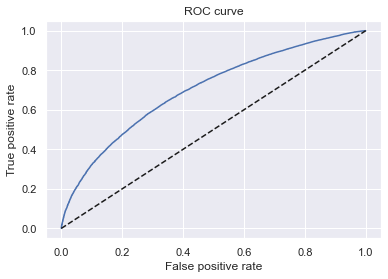

In [139]:
plt.plot(fpr, tpr)
plt.plot(fpr, fpr, linestyle = '--', color = 'k')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')

In [140]:
thresholds

array([1.99266955, 0.99266955, 0.99071534, ..., 0.44818004, 0.39392616,
       0.39324099])

In [141]:
thresholds.shape

(17320,)

In [142]:
# now store the data in new dataframe with selecting cut-offs
df_cutoffs = pd.concat([pd.DataFrame(thresholds), pd.DataFrame(fpr), pd.DataFrame(tpr)], axis = 1)

In [143]:
df_cutoffs.columns = ['thresholds', 'fpr', 'tpr']

In [144]:
df_cutoffs.head()

,thresholds,fpr,tpr
0,1.992670,0.000000,0.000000
1,0.992670,0.000000,0.000012
2,0.990715,0.000000,0.000120
3,0.990678,0.000098,0.000120
4,0.989778,0.000098,0.000445


In [145]:
# 1st row will be not be usefull. so either drop or set the threshold close to 1
df_cutoffs['thresholds'][0] = 1 - 1 / np.power(10, 16)

In [146]:
# Since scores are much interpretable so we opt for then to sets the cut-offs
# Now we reverse the cakculation and find the score based on the Prob. to be good
df_cutoffs['Score'] = ((np.log(df_cutoffs['thresholds'] / (1 - df_cutoffs['thresholds'])) - min_sum_coef) * ((max_score - min_score) / (max_sum_coef - min_sum_coef)) + min_score).round()

In [147]:
df_cutoffs.head()

,thresholds,fpr,tpr,Score
0,1.000000,0.000000,0.000000,2077.0
1,0.992670,0.000000,0.000012,795.0
2,0.990715,0.000000,0.000120,776.0
3,0.990678,0.000098,0.000120,776.0
4,0.989778,0.000098,0.000445,769.0


In [148]:
# here the maximum score is very high & out of range. so we place max score at the first place 
df_cutoffs['Score'][0] = max_score

In [149]:
df_cutoffs.head()

,thresholds,fpr,tpr,Score
0,1.000000,0.000000,0.000000,850.0
1,0.992670,0.000000,0.000012,795.0
2,0.990715,0.000000,0.000120,776.0
3,0.990678,0.000098,0.000120,776.0
4,0.989778,0.000098,0.000445,769.0


In [150]:
df_cutoffs.tail()

,thresholds,fpr,tpr,Score
17315,0.488999,0.999607,0.999964,409.0
17316,0.484371,0.999607,0.999976,407.0
17317,0.448180,0.999902,0.999976,396.0
17318,0.393926,0.999902,1.000000,379.0
17319,0.393241,1.000000,1.000000,378.0


In [151]:
# Now we see the approval & rejection rates for each possible cut-offs
#      no. of approved + no. of rejected = Total
#      Approval rate = no. of approved / Total
#      Rejection rate = no. of rejection / Total   OR    = 1 - Approval rate

# lets create a function that calculates the no. of approved applicants for a given prob. threshold

In [152]:
# This function returns the no. of borrowers, for which the predicted prob. is >= p

def n_approved(p):
    return np.where(df_actual_predicted_probs['y_hat_test_proba'] >= p, 1, 0).sum()

In [153]:
df_cutoffs['N Approved'] = df_cutoffs['thresholds'].apply(n_approved)
df_cutoffs['N Rejected'] = df_actual_predicted_probs['y_hat_test_proba'].shape[0] - df_cutoffs['N Approved']
df_cutoffs['Approval Rate'] = df_cutoffs['N Approved'] / df_actual_predicted_probs['y_hat_test_proba'].shape[0]
df_cutoffs['Rejection Rate'] = 1 - df_cutoffs['Approval Rate']

In [154]:
df_cutoffs.head()

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
0,1.000000,0.000000,0.000000,850.0,0,93257,0.000000,1.000000
1,0.992670,0.000000,0.000012,795.0,1,93256,0.000011,0.999989
2,0.990715,0.000000,0.000120,776.0,10,93247,0.000107,0.999893
3,0.990678,0.000098,0.000120,776.0,11,93246,0.000118,0.999882
4,0.989778,0.000098,0.000445,769.0,38,93219,0.000407,0.999593


In [155]:
df_cutoffs.tail()

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
17315,0.488999,0.999607,0.999964,409.0,93250,7,0.999925,0.000075
17316,0.484371,0.999607,0.999976,407.0,93251,6,0.999936,0.000064
17317,0.448180,0.999902,0.999976,396.0,93254,3,0.999968,0.000032
17318,0.393926,0.999902,1.000000,379.0,93256,1,0.999989,0.000011
17319,0.393241,1.000000,1.000000,378.0,93257,0,1.000000,0.000000


In [156]:
# lets assume the highest level of prob. we would accept is 10%. In other words, the lowest possible prob. of being good is 90%.
# PD at 10%
df_cutoffs.iloc[5000: 6200, ]

# approval rate = 53.67%
# rejection rate = 46.32%

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
5000,0.904020,0.256820,0.545066,587.0,47894,45363,0.513570,0.486430
5001,0.904012,0.256820,0.545126,587.0,47899,45358,0.513624,0.486376
5002,0.904008,0.256919,0.545126,587.0,47900,45357,0.513634,0.486366
5003,0.903996,0.256919,0.545223,587.0,47908,45349,0.513720,0.486280
5004,0.903996,0.257017,0.545223,587.0,47909,45348,0.513731,0.486269
5005,0.903992,0.257017,0.545247,587.0,47911,45346,0.513752,0.486248
5006,0.903991,0.257115,0.545247,587.0,47912,45345,0.513763,0.486237
5007,0.903991,0.257115,0.545259,587.0,47913,45344,0.513774,0.486226
5008,0.903990,0.257213,0.545259,587.0,47914,45343,0.513784,0.486216
5009,0.903959,0.257213,0.545511,587.0,47935,45322,0.514010,0.485990


In [157]:
# PD at 5%
df_cutoffs.iloc[1000: 2000, ]

# approval rate = 20.937%
# rejection rate = 79.06%

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
1000,0.953327,0.048871,0.205834,647.0,17596,75661,0.188683,0.811317
1001,0.953303,0.048871,0.206002,647.0,17610,75647,0.188833,0.811167
1002,0.953302,0.048970,0.206002,647.0,17611,75646,0.188844,0.811156
1003,0.953290,0.048970,0.206099,647.0,17619,75638,0.188930,0.811070
1004,0.953285,0.049068,0.206099,647.0,17620,75637,0.188940,0.811060
1005,0.953258,0.049068,0.206448,647.0,17649,75608,0.189251,0.810749
1006,0.953257,0.049166,0.206448,647.0,17650,75607,0.189262,0.810738
1007,0.953229,0.049166,0.206604,647.0,17663,75594,0.189401,0.810599
1008,0.953226,0.049264,0.206604,647.0,17664,75593,0.189412,0.810588
1009,0.953208,0.049264,0.206785,647.0,17679,75578,0.189573,0.810427


In [158]:
# Eport the data into csv
inputs_train_with_ref_cat.to_csv('inputs_train_with_ref_cat.csv')

In [159]:
df_scorecard.to_csv('df_scorecard.csv')

In [160]:
df_cutoffs

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
0,1.000000,0.000000,0.000000,850.0,0,93257,0.000000,1.000000
1,0.992670,0.000000,0.000012,795.0,1,93256,0.000011,0.999989
2,0.990715,0.000000,0.000120,776.0,10,93247,0.000107,0.999893
3,0.990678,0.000098,0.000120,776.0,11,93246,0.000118,0.999882
4,0.989778,0.000098,0.000445,769.0,38,93219,0.000407,0.999593
5,0.989750,0.000196,0.000445,769.0,39,93218,0.000418,0.999582
6,0.989004,0.000196,0.000903,763.0,77,93180,0.000826,0.999174
7,0.988985,0.000294,0.000903,763.0,78,93179,0.000836,0.999164
8,0.986563,0.000294,0.004575,747.0,383,92874,0.004107,0.995893
9,0.986560,0.000393,0.004575,747.0,384,92873,0.004118,0.995882


# PD Model monitaring

# Via Assesing the population stability

In [161]:
# Population stability index (PSI) is determine weather the new data are too different from the original data.
# (Values of PSI: 0-1)     (Population diffrence)
# PSI = 0                   No difference
# PSI < 0.1                 Little to No differnce
# 0.1 < PSI < 0.25          Little difference (No action is taken)
# PSI > 0.25                Big difference (Action is taken)
# PSI = 1                   Absolute difference